# Augmentation

Una prassi molto comune, specialmente in relazione ad applicazioni di Computer Vision, è quella della cosiddetta **data augmentation**. Questa pratica consiste nell'applicare delle trasformazioni di vario tipo ai dati di partenza al fine di generare dei dati aggiuntivi *sintetici* compatibili con i dati di partenza.

Nel caso di immagini, le trasformazioni più comunemente usate sono quelle che generano nuove immagini che siano altrettanto verosimili. Questo ovviamente dipende dal task di learning studiato.

Ad esempio, nel nostro caso il modello dovrebbe essere in grado di riconoscere una cellula indipendentemente dal suo orientamento, per cui ruotare le immagini originali è un modo semplice per aumentare la quantità di dati a disposizione e indirizzare l'addestramento verso un'invarianza rispetto a questa trasformazione.

Di seguito mostreremo alcune trasformazioni che fanno al caso nostro:

 - random crop
 - resize
 - rotazioni
 - illuminazione
 - zoom
 - distorsioni

### Setup

In [23]:
from itertools import product
from fastai.vision.all import *


IMG_PATH = Path('../fluocells_data/all_images/images')
MASK_PATH = Path('../fluocells_data/all_masks/masks')

sample_img_names = ['Mar32bS2C2R2_DMl_200x_y.png', 'Mar27bS1C2R1_LHr_200x_y.png',
                    'Mar26bS2C1R2_LHr_200x_y.png', 'Mar41S3C1R1_DMr_200x_o.png']

sample_paths = [IMG_PATH / filename for filename in sample_img_names]


def _batch_ex(bs, pilimg):
    timg = TensorImage(array(pilimg)).permute(2, 0, 1).float()/255.
    return TensorImage(timg[None].expand(bs, *timg.shape).clone())

seed = 4
random.seed(seed)

## Crop

Partendo da foto ad alta risoluzione, una strategia semplice per aumentare il numero di immagini a disposizione per il training è quello di estrarre dei ritagli di dimensione inferiore (**crop**).

Questo può essere fatto sia sistematicamente, i.e. suddividere l'immagine originale in un numero predefinito di crop adiacenti, oppure **stocasticamente**, i.e. campionando i pixel dove applicare il ritaglio.

<div class="alert alert-block alert-info">
Spesso è difficile dire quale alternativa funzioni meglio a priori, per cui solitamente si finisce per provarle entrambe e vedere cosa funziona meglio in pratica.
</div>

<div class="alert alert-block alert-info">

Nel nostro caso applicheremo questa seconda strategia per convenienza implementativa. Nel caso tu voglia testare anche l'alternativa, puoi trovare un'implementazione [qui](https://github.com/clissa/cell-segmentation/blob/11e7b39a69e801fe0a005015c0882e78e297c010/030_cropper.py).
    
</div>


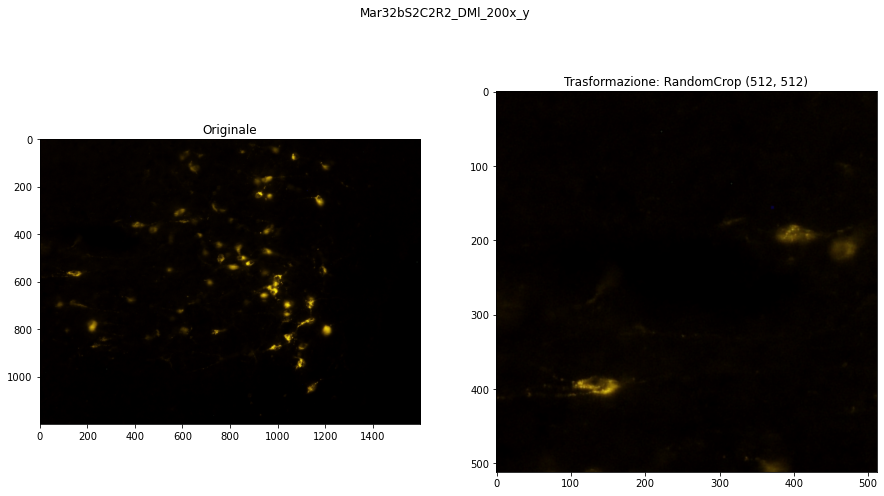

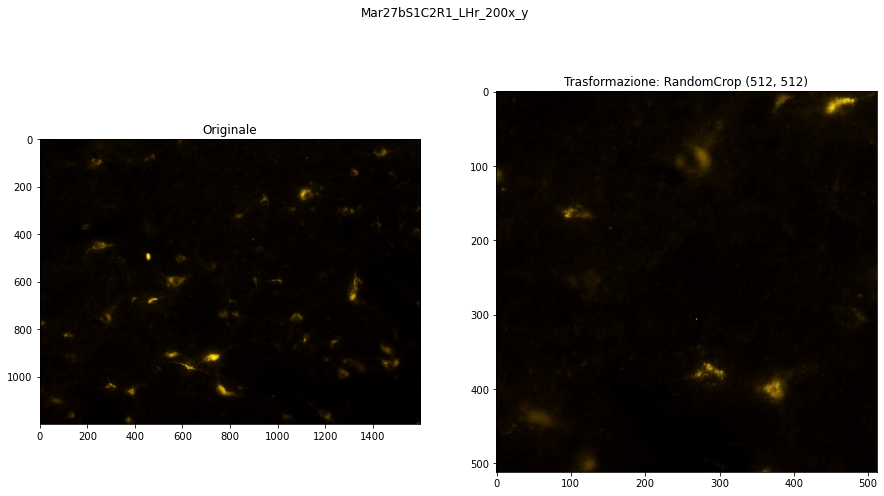

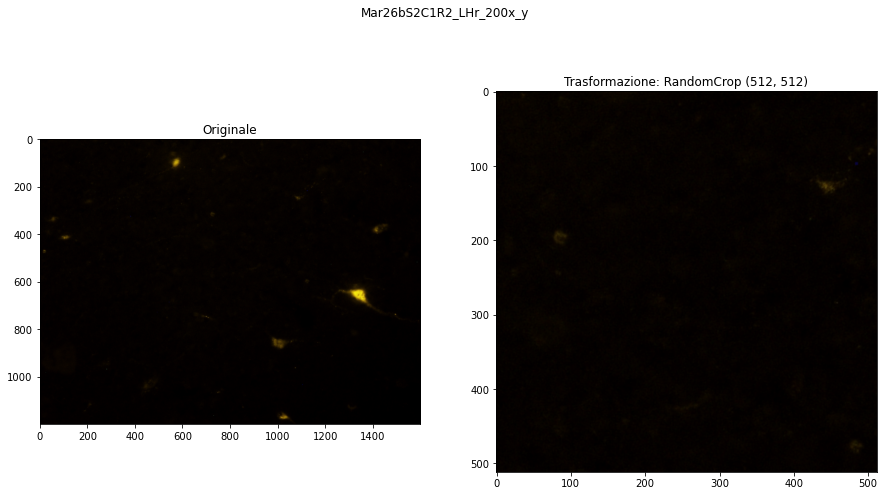

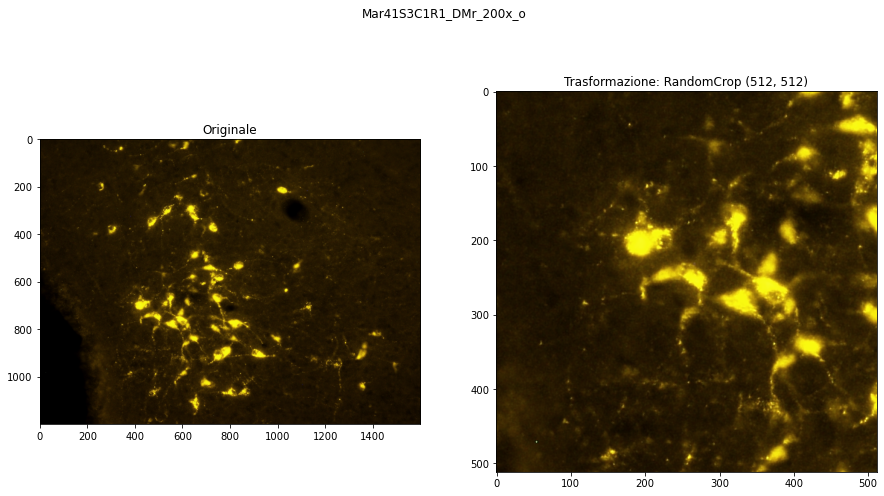

In [16]:
tfm = RandomCrop(512) # square crop

for im_path in sample_paths:
    im = PILImage.create(im_path)
    fig, ax = plt.subplots(1, 2, figsize=(15, 8))
    plt.suptitle(im_path.stem)
    ax[0].imshow(im)
    ax[0].set_title('Originale')
    ax[1].imshow(tfm(im))
    ax[1].set_title(f'Trasformazione: {tfm.name.split(" ")[0]} {tfm.size}')
    plt.show()

## Resize

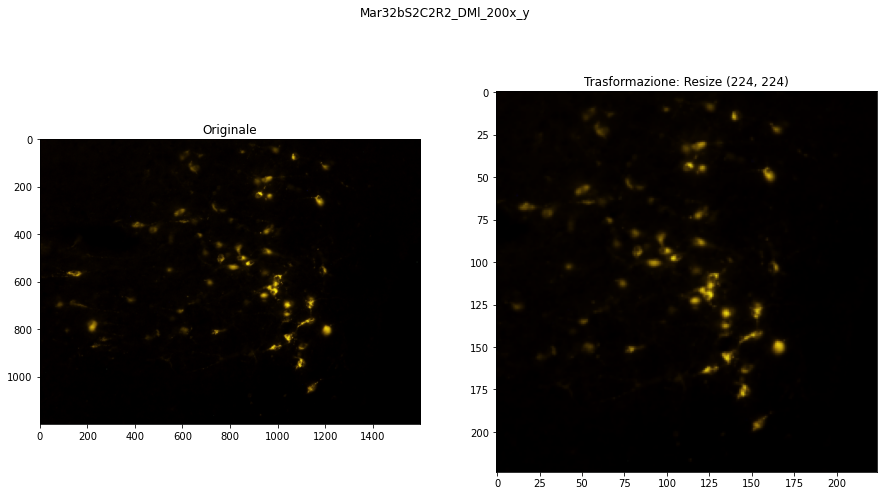

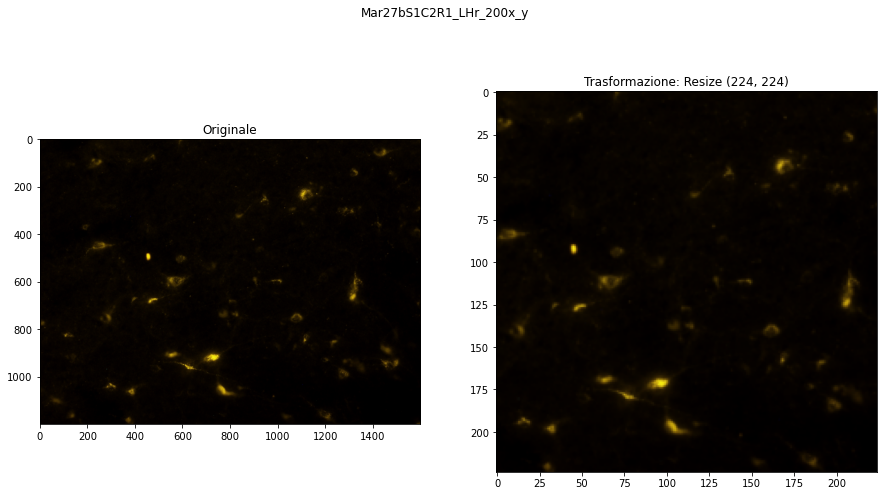

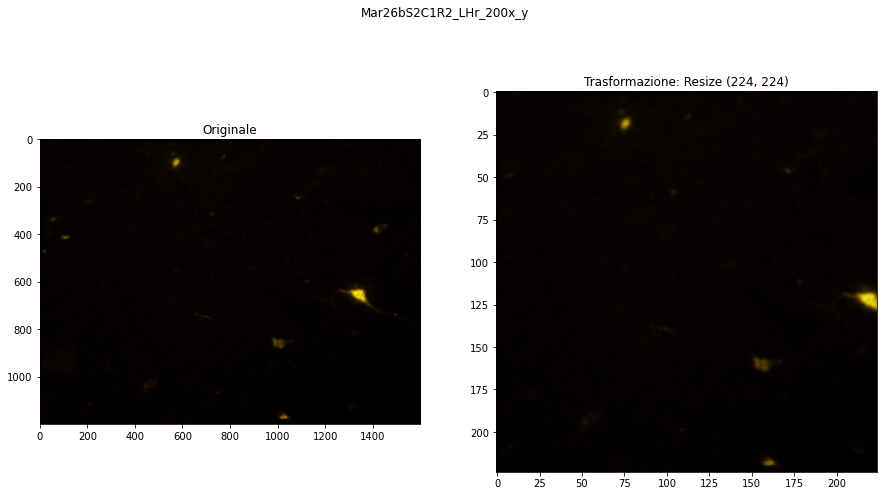

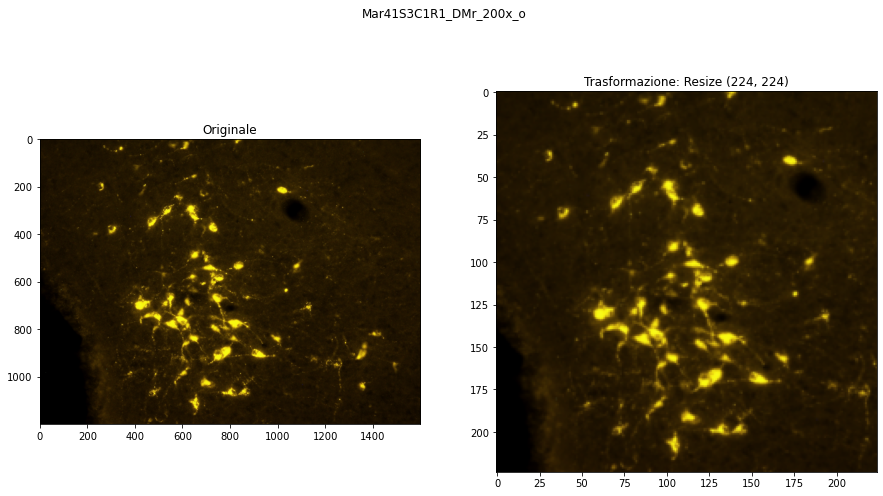

In [17]:
tfm = Resize(224) # square image

for im_path in sample_paths:
    im = PILImage.create(im_path)
    fig, ax = plt.subplots(1, 2, figsize=(15, 8))
    plt.suptitle(im_path.stem)
    ax[0].imshow(im)
    ax[0].set_title('Originale')
    ax[1].imshow(tfm(im))
    ax[1].set_title(f'Trasformazione: {tfm.name.split(" ")[0]} {tfm.size}')
    plt.show()

## Rotazioni

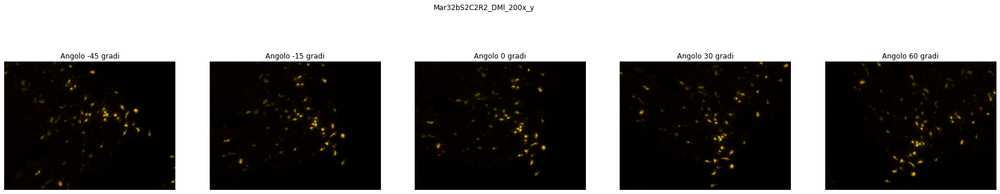

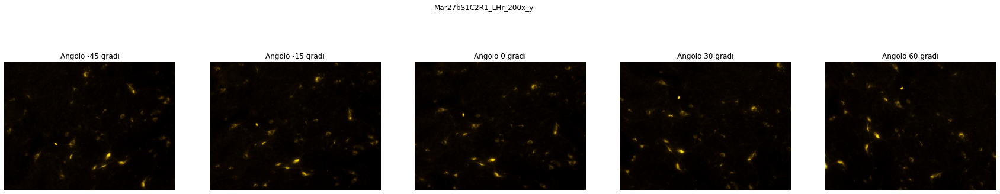

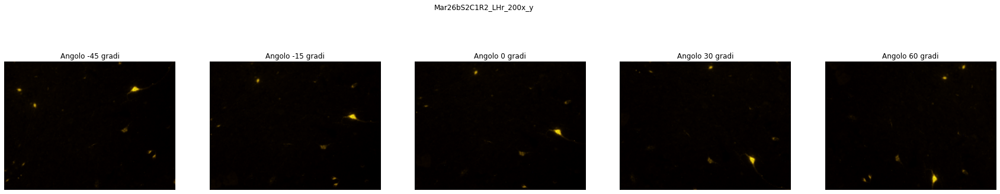

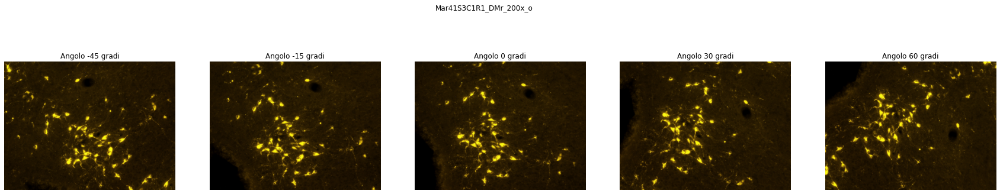

In [31]:
angoli = [-45,-15,0,30,60]
tfm = Rotate(p=1., draw=angoli) # square image

for im_path in sample_paths:
    im = PILImage.create(im_path)
    x = _batch_ex(len(angoli), im)
    show_images(tfm(x), suptitle=im_path.stem,
                titles=[f'Angolo: {i} gradi' for i in angoli], figsize=(30,6))
    plt.show()

## Illuminazione

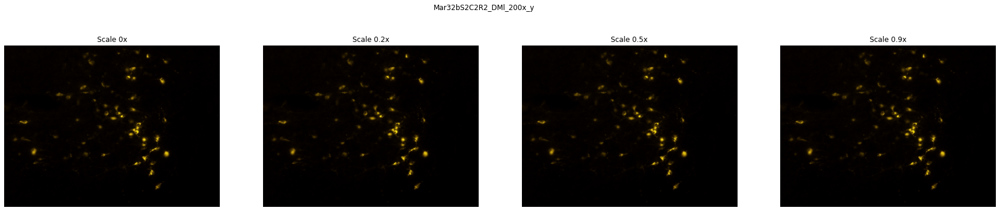

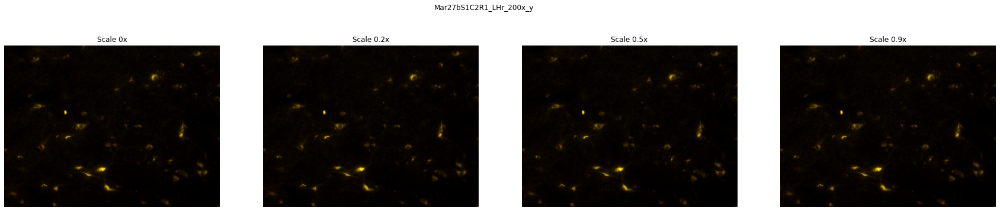

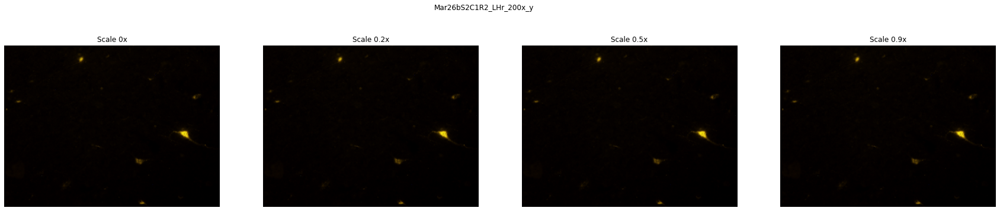

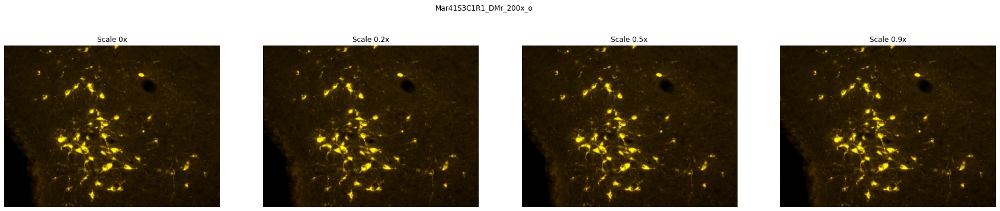

In [38]:
scala = [0, 0.2, 0.5, 0.9]

tfm = Brightness(p=1., max_lighting=0.5)#draw=scala,)
for im_path in sample_paths:
    im = PILImage.create(im_path)
    x = _batch_ex(len(scala), im)
    show_images(tfm(x), suptitle=im_path.stem,
                titles=[f'Scale {i}x' for i in scala], figsize=(30,6))

## Zoom

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

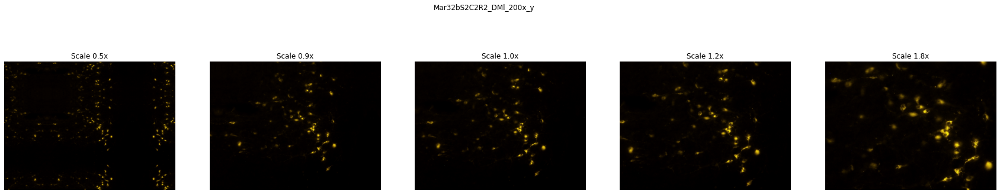

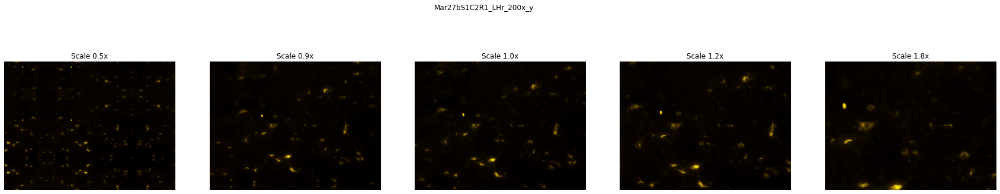

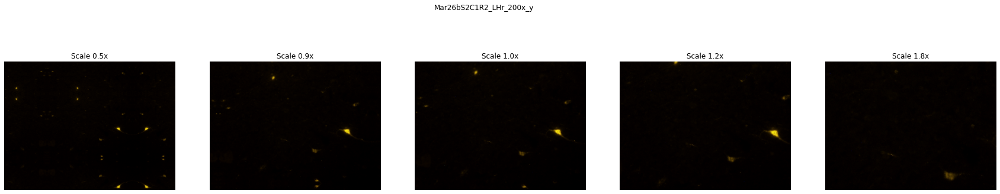

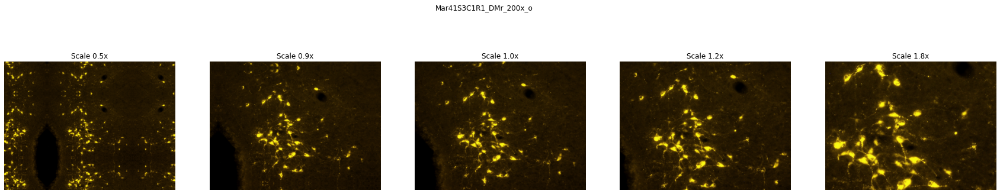

In [34]:
scala = [0.5,0.9, 1., 1.2, 1.8]

tfm = Zoom(p=1., draw=scala, draw_x=0.5, draw_y=0.5,
         pad_mode='reflection', mode='bicubic')

for im_path in sample_paths:
    im = PILImage.create(im_path)
    x = _batch_ex(len(scala), im)
    show_images(tfm(x), suptitle=im_path.stem,
                titles=[f'Scale {i}x' for i in scala], figsize=(30,6))

## Distorsione

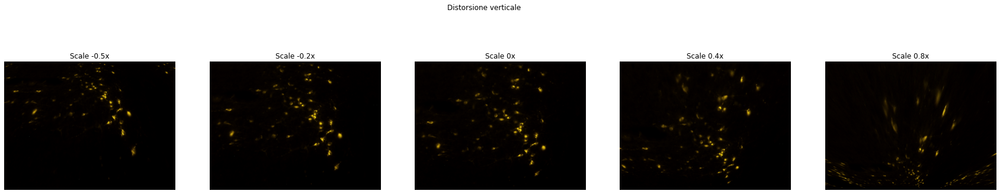

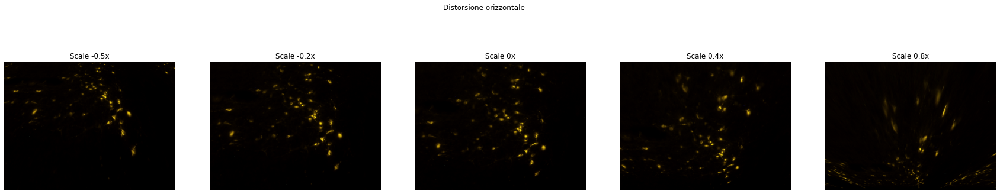

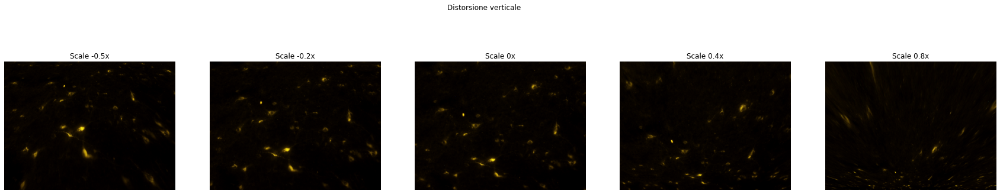

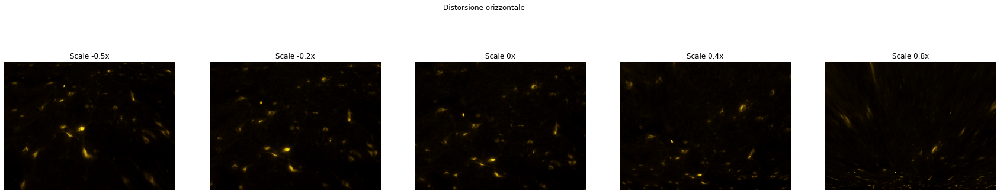

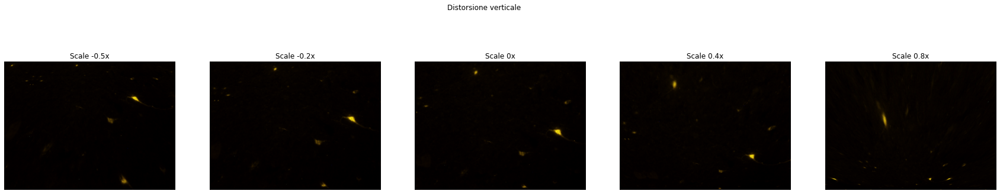

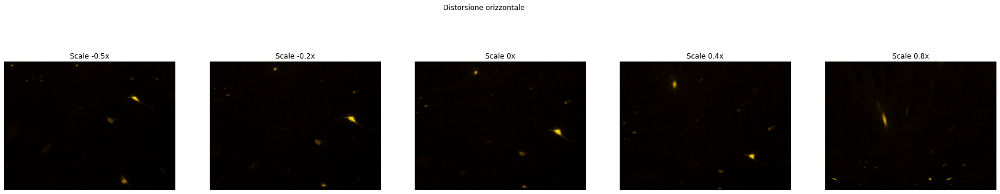

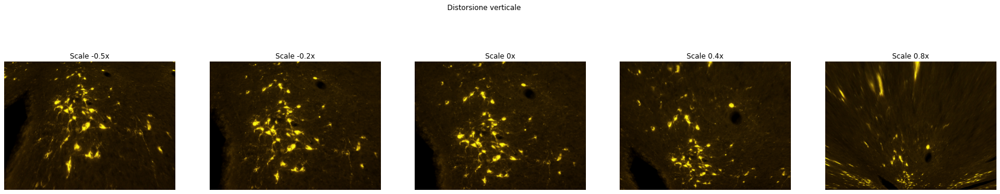

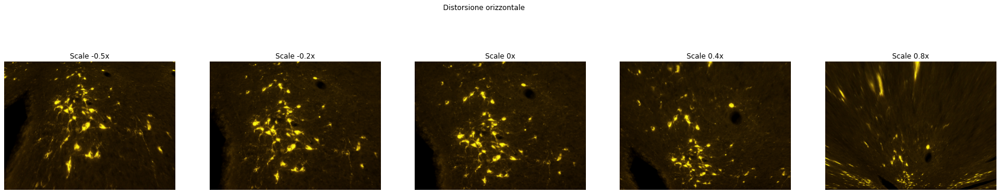

In [45]:
scala = [-0.5,-0.2, 0, 0.4, 0.8]

vert_warp = Warp(p=1., draw_y=scala, draw_x=0.)
horz_warp = Warp(p=1., draw_x=scala, draw_y=0.)


for im_path in sample_paths:
    im = PILImage.create(im_path)
    x = _batch_ex(len(scala), im)
    show_images(vert_warp(x), suptitle="Distorsione verticale",
                titles=[f'Scale {i}x' for i in scala], figsize=(30,6))
    show_images(vert_warp(x), suptitle="Distorsione orizzontale",
                titles=[f'Scale {i}x' for i in scala], figsize=(30,6))

<div class="alert alert-block alert-info">

Per maggiori informazioni è possibile consultare la [documentazione](https://docs.fast.ai/vision.augment.html) della libreria fastai.
</div>

# Pipeline completa

Per convenienza, fastai permette di accodare le trasformazioni in una pipeline in modo da eseguirle *on the fly* al momento della lettura dei dati. 

Di seguito è riportato il codice rifattorizzato che permette di fare queste operazioni.

In [1]:
BS = 2
CROP_SIZE = 512
RESIZE = 224
MAX_LIGHT = 0.1
ZOOM_DELTA = 0.9  # min_zoom = 1 - ZOOM_DELTA; max_zoom = 1 + ZOOM_DELTA
MAX_ROTATION_ANGLE = 15.0

hyperparameter_defaults = dict(
    crop_size=CROP_SIZE,
    resize=RESIZE,
    batch_size=BS,
    angle=MAX_ROTATION_ANGLE,
    zoom_delta=ZOOM_DELTA,
    max_light=MAX_LIGHT,
)

# cfg = namedtuple('Config', hyperparameter_defaults.keys())(
#     **hyperparameter_defaults)

In [2]:
from pathlib import Path
from fastai.vision.all import *

cfg = namedtuple('Config', hyperparameter_defaults.keys())(
    **hyperparameter_defaults)

IMG_PATH = Path('../fluocells_data/all_images/images')
# MASK_PATH = Path('../fluocells_data/all_masks/masks')

path = IMG_PATH.parent
def label_func(p):
    return Path(str(p).replace('images', 'masks'))


# augmentation

tfms = [

    IntToFloatTensor(div_mask=255.),  # need masks in [0, 1] format
        RandomCrop(512), # first resize
    * aug_transforms(
        size=224, # second resize
        max_lighting=0.1, p_lighting=0.5,
        min_zoom=0.9, max_zoom=1.1,
        max_warp=0, max_rotate=15.0
    )
]

dls = SegmentationDataLoaders.from_label_func(
    path, fnames=get_image_files(path / 'images'), label_func=label_func,
    bs=cfg.batch_size, splitter=RandomSplitter(valid_pct=0.3, seed=42),
    #     item_tfms=pre_tfms,
    batch_tfms=tfms,
    device='cuda'
)


x, y = dls.one_batch()
print(x.shape, y.shape)
x.min(), x.max(), y.min(), y.max()

/home/luca/anaconda3/envs/fx/lib/python3.9/site-packages/torch/_tensor.py:1051: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  ret = func(*args, **kwargs)


torch.Size([2, 3, 224, 224]) torch.Size([2, 224, 224])


(TensorImage(1.0247e-07, device='cuda:0'),
 TensorImage(0.9082, device='cuda:0'),
 TensorMask(0, device='cuda:0'),
 TensorMask(1, device='cuda:0'))

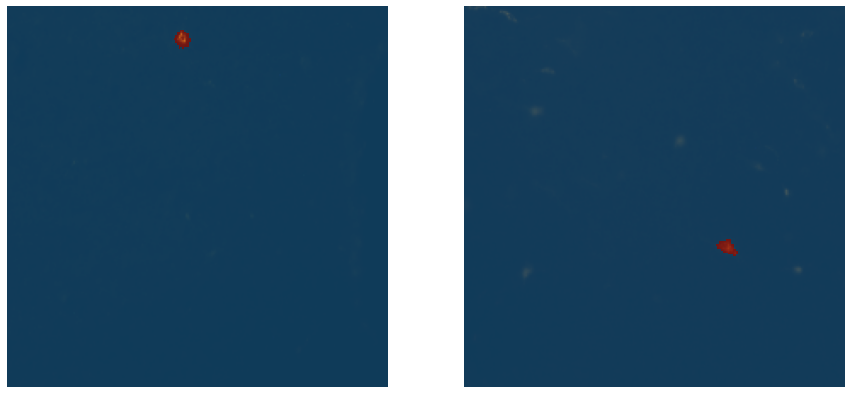

In [22]:
dls.show_batch(figsize=(15,8), vmin=0, vmax=3)